# pyCisTopic scATAC processing

In [1]:
import pycisTopic
import pandas as pd
import os
pycisTopic.__version__

'2.0a0'

In [ ]:
!ls /outs

20250409_cistopic_obj.pkl  consensus_peak_calling  qc
cistopic_obj.pkl	   models.pkl


In [ ]:
! pwd

In [ ]:
os.chdir(os.getcwd())

# Once the cistopic modeling is finished

In [5]:
! cat logs/R-cistopic_modelling.64307600.out

SLURM_JOB_ID: 64307600
SLURM_JOB_USER: vsc33857
SLURM_JOB_ACCOUNT: lp_big_wice_cpu
SLURM_JOB_NAME: cistopic_modelling
SLURM_CLUSTER_NAME: wice
SLURM_JOB_PARTITION: dedicated_big_bigmem
SLURM_NNODES: 1
SLURM_NODELIST: i28l20
SLURM_JOB_CPUS_PER_NODE: 30
Date: Tue Apr  8 17:29:44 CEST 2025
Walltime: 00-10:00:00
CistopicObject from project cisTopic_merge with n_cells × n_regions = 11327 × 224360
2025-04-08 17:29:49,783 cisTopic     INFO     Formatting input to corpus
2025-04-08 17:29:50,616 cisTopic     INFO     Running model with 2 topics
2025-04-08 17:29:50,617 LDAMalletWrapper INFO     Serializing temporary corpus to /scratch/leuven/338/vsc33857/ray_spill/mallet/tutorial/corpus.txt
2025-04-08 17:30:10,921 LDAMalletWrapper INFO     Converting temporary corpus to MALLET format with: Mallet-202108/bin/mallet import-file --preserve-case --keep-sequence --token-regex \S+ --input /scratch/leuven/338/vsc33857/ray_spill/mallet/tutorial/corpus.txt --output /scratch/leuven/338/vsc33857/ray_spill/

In [ ]:
import pickle
file_path = "/outs/cistopic_obj.pkl"
with open(file_path, 'rb') as file:
    cistopic_obj = pickle.load(file)

print(cistopic_obj)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 11327 × 224360


In [7]:
cistopic_obj.cell_data

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,cisTopic_log_nr_frag,pdf_values_for_duplication_ratio,log10_total_fragments_in_peaks_count,duplication_count,pdf_values_for_fraction_of_fragments_in_peaks,unique_fragments_count,fraction_of_fragments_in_peaks,barcode,cell_type,sample_id
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243,48,5.238723,148120,122028,112191,5.049962,...,5.086459,1.066572,5.170617,55542,0.360433,173269,0.647496,CTCACCACACTAATCC,NaN,NaN
GTCTAGCTCCAGGATG-D0___D0,3.878234,0.040761,3.598462,3967,1403,3.763877,5399,4431,4112,3.614159,...,3.646502,13.586348,3.732394,1749,2.916648,5805,0.708355,GTCTAGCTCCAGGATG,Naive_B_cells,D0
CTAATGTTCTTTGGGC-D0___D0,4.943682,0.007757,4.481973,30337,144,4.832649,55112,46460,42689,4.630326,...,4.667079,3.295278,4.741254,19816,0.498514,68021,0.627586,CTAATGTTCTTTGGGC,Pro-B_cells_D0,D0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679,21,5.436795,215174,176098,161176,5.207303,...,5.245754,0.497682,5.332792,89614,0.084456,273397,0.589531,CTAGGATAGTGGCTTC,NaN,NaN
TCCTCAAAGGCCTAAG-D0___D0,5.161077,0.008855,4.642306,43884,88,5.046507,94715,78871,72652,4.861254,...,4.896917,2.800991,4.976423,33600,0.492707,111302,0.652747,TCCTCAAAGGCCTAAG,Pro-B_cells_D0,D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCAATTGTAGGTGAC-Q3___Q3,3.575419,0.050653,3.202488,1594,2244,3.405346,2457,1793,1634,3.213518,...,3.25358,15.067269,3.390582,1219,2.489732,2542,0.642801,GCCAATTGTAGGTGAC,Pro-B_cells_Q3,Q3
GAGGGTGAGGTATGGT-Q3___Q3,3.422261,0.032544,3.083861,1213,2478,3.247237,1851,1324,1225,3.088490,...,3.121888,3.331083,3.267641,877,1.625805,1766,0.693658,GAGGGTGAGGTATGGT,Pro-B_cells_Q3,Q3
GCATTGTGTGGTGAAC-Q3___Q3,3.469380,0.034797,3.02735,1065,2419,3.306425,1654,1212,1116,3.048053,...,3.083503,10.392708,3.218798,922,0.858024,2024,0.551383,GCATTGTGTGGTGAAC,Pro-B_cells_Q3,Q3
TGGACCAAGGTTGTAA-Q3___Q3,3.514415,0.033143,3.20871,1617,2350,3.346939,2421,1788,1641,3.215373,...,3.252368,19.262841,3.384174,1046,1.802330,2222,0.738524,TGGACCAAGGTTGTAA,Pro-B_cells_Q3,Q3


In [ ]:
file_path = "/outs/models.pkl"
with open(file_path, 'rb') as file:
    models = pickle.load(file)

print(models)

/opt/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-09 16:46:06,996	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


[<pycisTopic.lda_models.CistopicLDAModel object at 0x153a32157d90>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73b1d10>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73b4d50>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73b8610>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73c4150>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73c7ed0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73cff10>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73e0210>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73ec790>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73f0f90>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1539e73f9990>]


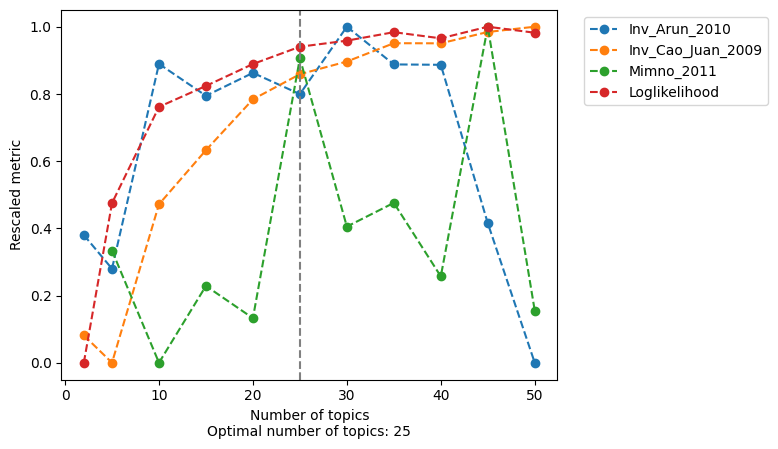

In [9]:
from pycisTopic.lda_models import evaluate_models
model = evaluate_models(
    models,
    select_model = 25,
    return_model = True
)

choosing model with 25 topics since Mimno is probably the most imporant metric

In [10]:
cistopic_obj.add_LDA_model(model)

In [11]:
out_dir = "outs"
os.makedirs(out_dir, exist_ok = True)

In [12]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "cistopic_obj.pkl"), "wb")
)

# Clustering and visualisation

In [13]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [14]:
find_clusters(
    cistopic_obj,
    target  = 'cell',
    k = 10,
    res = [0.2,0.3,0.6, 1.2, 3,6],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '-'
)

2025-04-09 16:46:15,967 cisTopic     INFO     Finding neighbours


In [15]:
cistopic_obj.cell_data

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,fraction_of_fragments_in_peaks,barcode,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243,48,5.238723,148120,122028,112191,5.049962,...,0.647496,CTCACCACACTAATCC,NaN,NaN,1,1,7,15,32,49
GTCTAGCTCCAGGATG-D0___D0,3.878234,0.040761,3.598462,3967,1403,3.763877,5399,4431,4112,3.614159,...,0.708355,GTCTAGCTCCAGGATG,Naive_B_cells,D0,7,8,11,18,27,26
CTAATGTTCTTTGGGC-D0___D0,4.943682,0.007757,4.481973,30337,144,4.832649,55112,46460,42689,4.630326,...,0.627586,CTAATGTTCTTTGGGC,Pro-B_cells_D0,D0,1,1,7,8,4,0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679,21,5.436795,215174,176098,161176,5.207303,...,0.589531,CTAGGATAGTGGCTTC,NaN,NaN,1,1,7,15,32,49
TCCTCAAAGGCCTAAG-D0___D0,5.161077,0.008855,4.642306,43884,88,5.046507,94715,78871,72652,4.861254,...,0.652747,TCCTCAAAGGCCTAAG,Pro-B_cells_D0,D0,1,1,7,15,32,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCAATTGTAGGTGAC-Q3___Q3,3.575419,0.050653,3.202488,1594,2244,3.405346,2457,1793,1634,3.213518,...,0.642801,GCCAATTGTAGGTGAC,Pro-B_cells_Q3,Q3,2,2,1,4,9,15
GAGGGTGAGGTATGGT-Q3___Q3,3.422261,0.032544,3.083861,1213,2478,3.247237,1851,1324,1225,3.088490,...,0.693658,GAGGGTGAGGTATGGT,Pro-B_cells_Q3,Q3,2,2,1,4,9,51
GCATTGTGTGGTGAAC-Q3___Q3,3.469380,0.034797,3.02735,1065,2419,3.306425,1654,1212,1116,3.048053,...,0.551383,GCATTGTGTGGTGAAC,Pro-B_cells_Q3,Q3,1,1,2,1,18,9
TGGACCAAGGTTGTAA-Q3___Q3,3.514415,0.033143,3.20871,1617,2350,3.346939,2421,1788,1641,3.215373,...,0.738524,TGGACCAAGGTTGTAA,Pro-B_cells_Q3,Q3,2,2,1,4,10,19


In [16]:
run_umap(
    cistopic_obj,
    target  = 'cell', scale=True)

2025-04-09 16:46:23,285 cisTopic     INFO     Running UMAP


/opt/venv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [17]:
run_tsne(
    cistopic_obj,
    target  = 'cell', scale=True)

2025-04-09 16:46:48,123 cisTopic     INFO     Running TSNE


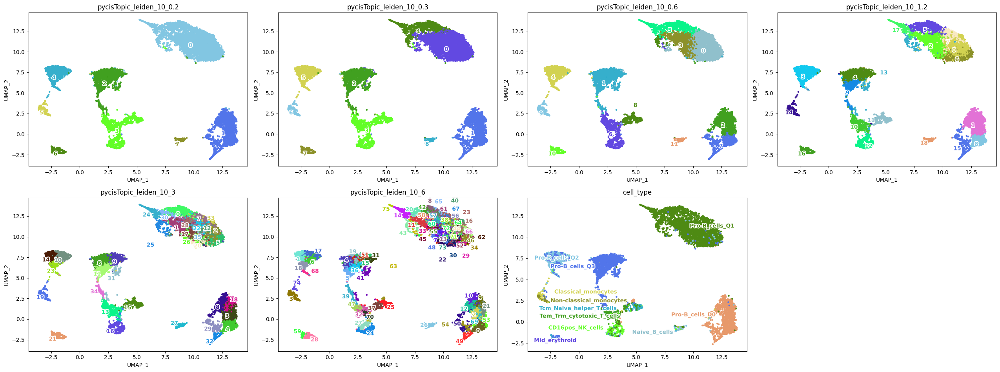

In [18]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['pycisTopic_leiden_10_0.2', 'pycisTopic_leiden_10_0.3','pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3','pycisTopic_leiden_10_6','cell_type'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

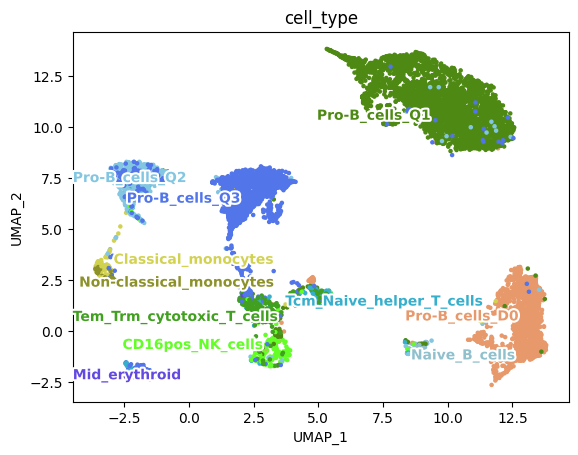

In [19]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type'],
    target='cell',
    text_size=10,
    dot_size=5)

In [20]:
cistopic_obj.cell_data['is_nan'] = cistopic_obj.cell_data['cell_type'].isna()
cistopic_obj.cell_data['is_nan'].value_counts()

False    8371
True     2956
Name: is_nan, dtype: int64

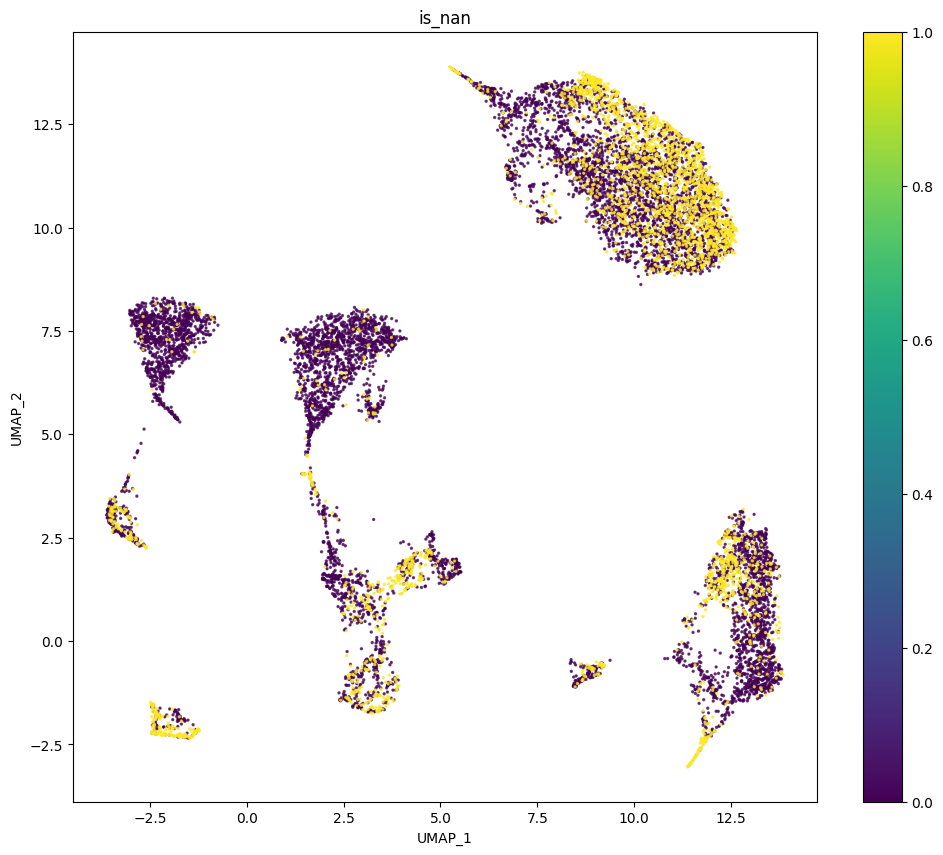

In [21]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['is_nan'],
    remove_nan = False,
    show_label = False,
    target='cell',
    text_size=10,
    dot_size=2,
    alpha = 0.7,
    figsize = (12,10))



# Impute missing cell type labels

Some cells do not have RNA counterpart and hence no cell type annotation. I use KNN = 5 on UMAP projection to impute the missing cell types. 

In [22]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

label = 'cell_type_all'

# Extract UMAP coordinates and cell type labels
cistopic_obj.cell_data[label] = cistopic_obj.cell_data['cell_type'].copy()
umap_coords = cistopic_obj.projections['cell']['UMAP']
cell_types = cistopic_obj.cell_data[label]  


missing_mask = cell_types.isna()

# split
X_labeled = umap_coords[~missing_mask]
y_labeled = cell_types[~missing_mask]
X_unlabeled = umap_coords[missing_mask]

#  KNN classifier on labeled data
knn = KNeighborsClassifier(n_neighbors=5)  
knn.fit(X_labeled, y_labeled)


imputed_labels = knn.predict(X_unlabeled) # predict


cistopic_obj.cell_data.loc[missing_mask, label] = imputed_labels

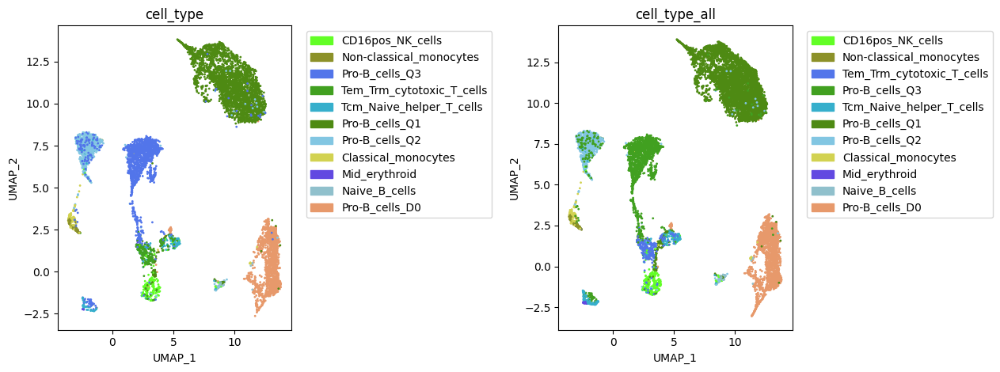

In [23]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type','cell_type_all'],
    target='cell', num_columns=2,
    text_size=3,
    show_label = False,
    show_legend= True,
    dot_size=1)

In [24]:
cistopic_obj.cell_data.cell_type.value_counts()

Pro-B_cells_Q1               3204
Pro-B_cells_Q3               1681
Pro-B_cells_D0               1572
Pro-B_cells_Q2                933
CD16pos_NK_cells              239
Tcm_Naive_helper_T_cells      225
Tem_Trm_cytotoxic_T_cells     211
Classical_monocytes           138
Naive_B_cells                  98
Non-classical_monocytes        61
Mid_erythroid                   9
Name: cell_type, dtype: int64

In [25]:
cistopic_obj.cell_data.cell_type_all.value_counts()

Pro-B_cells_Q1               5062
Pro-B_cells_D0               2030
Pro-B_cells_Q3               1778
Pro-B_cells_Q2                964
Tcm_Naive_helper_T_cells      412
CD16pos_NK_cells              361
Tem_Trm_cytotoxic_T_cells     278
Classical_monocytes           192
Naive_B_cells                 135
Non-classical_monocytes        88
Mid_erythroid                  27
Name: cell_type_all, dtype: int64

In [26]:
subset = cistopic_obj.cell_data[cistopic_obj.cell_data['cell_type'].isna()]  # check the predicted cell types
subset

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6,is_nan,cell_type_all
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243,48,5.238723,148120,122028,112191,5.049962,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679,21,5.436795,215174,176098,161176,5.207303,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
CTCTCAGCAGGTTCTT-D0___D0,4.076604,0.004384,3.677151,4755,1027,3.964966,6849,5717,5275,3.722305,...,NaN,NaN,3,3,6,12,16,24,True,CD16pos_NK_cells
TTACCGGGTTTATCCT-D0___D0,5.359354,0.005746,4.791775,61912,46,5.245226,147919,123451,113522,5.055084,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
TCCCGAAGTTACTCCC-D0___D0,5.506455,0.004542,4.850873,70937,27,5.390361,205783,170826,157105,5.196193,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGCCTTTAGGTTCCGT-Q3___Q3,3.804957,0.021669,3.351216,2245,1764,3.636488,3447,2530,2333,3.368101,...,NaN,NaN,5,6,9,14,19,3,True,Non-classical_monocytes
GTGGACCAGGGTGGGA-Q3___Q3,3.426023,0.027662,3.071882,1180,2461,3.269046,1732,1306,1194,3.077368,...,NaN,NaN,2,2,1,4,9,51,True,Pro-B_cells_Q3
AGGACTAGTTAACACC-Q3___Q3,3.774371,0.006444,3.305566,2021,1817,3.614897,3197,2390,2210,3.344589,...,NaN,NaN,6,7,10,16,21,28,True,Tcm_Naive_helper_T_cells
TATTAGGAGCTCGACT-Q3___Q3,3.639785,0.046737,3.202488,1594,2122,3.476976,2335,1737,1585,3.200303,...,NaN,NaN,0,0,0,0,33,40,True,Pro-B_cells_Q3


In [27]:
subset.cell_type_all.value_counts()

Pro-B_cells_Q1               1858
Pro-B_cells_D0                458
Tcm_Naive_helper_T_cells      187
CD16pos_NK_cells              122
Pro-B_cells_Q3                 97
Tem_Trm_cytotoxic_T_cells      67
Classical_monocytes            54
Naive_B_cells                  37
Pro-B_cells_Q2                 31
Non-classical_monocytes        27
Mid_erythroid                  18
Name: cell_type_all, dtype: int64

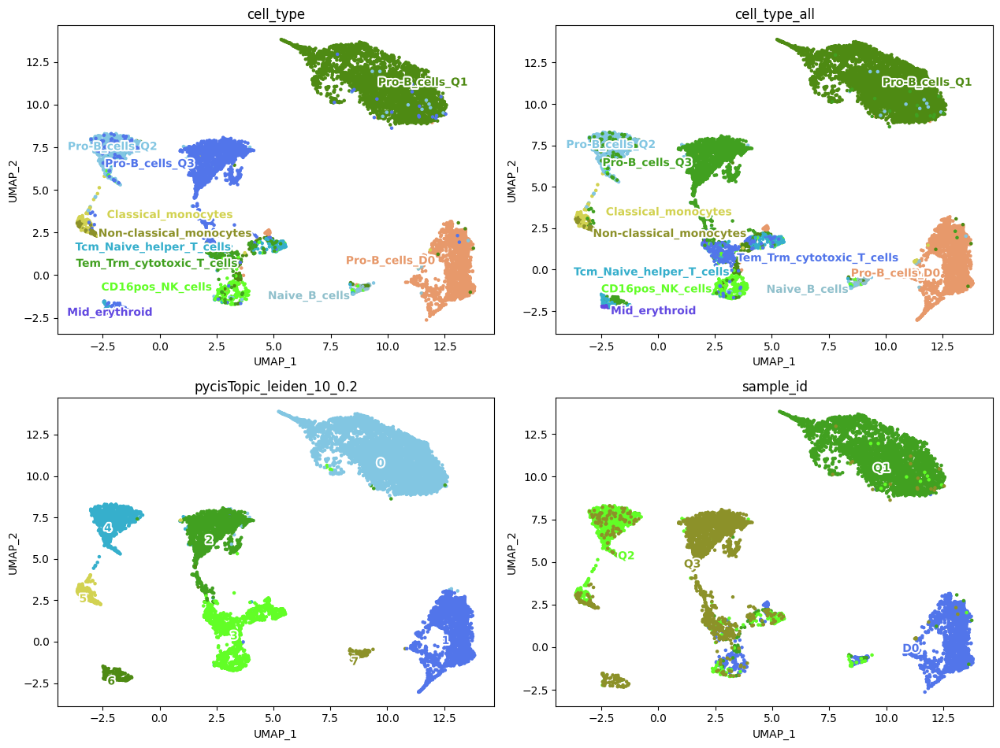

In [28]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type','cell_type_all','pycisTopic_leiden_10_0.2','sample_id'],
    target='cell', num_columns=2,
    text_size=10,
    dot_size=5)

In [29]:
cistopic_obj.cell_data['sample_id'].isna().sum()

2956

In [30]:
cistopic_obj.cell_data['cell_type'].isna().sum() # there is  2956 cells that do not have RNA counterpart

2956

In [31]:
cistopic_obj.cell_data

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6,is_nan,cell_type_all
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243,48,5.238723,148120,122028,112191,5.049962,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
GTCTAGCTCCAGGATG-D0___D0,3.878234,0.040761,3.598462,3967,1403,3.763877,5399,4431,4112,3.614159,...,Naive_B_cells,D0,7,8,11,18,27,26,False,Naive_B_cells
CTAATGTTCTTTGGGC-D0___D0,4.943682,0.007757,4.481973,30337,144,4.832649,55112,46460,42689,4.630326,...,Pro-B_cells_D0,D0,1,1,7,8,4,0,False,Pro-B_cells_D0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679,21,5.436795,215174,176098,161176,5.207303,...,NaN,NaN,1,1,7,15,32,49,True,Pro-B_cells_D0
TCCTCAAAGGCCTAAG-D0___D0,5.161077,0.008855,4.642306,43884,88,5.046507,94715,78871,72652,4.861254,...,Pro-B_cells_D0,D0,1,1,7,15,32,49,False,Pro-B_cells_D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCAATTGTAGGTGAC-Q3___Q3,3.575419,0.050653,3.202488,1594,2244,3.405346,2457,1793,1634,3.213518,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,15,False,Pro-B_cells_Q3
GAGGGTGAGGTATGGT-Q3___Q3,3.422261,0.032544,3.083861,1213,2478,3.247237,1851,1324,1225,3.088490,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,51,False,Pro-B_cells_Q3
GCATTGTGTGGTGAAC-Q3___Q3,3.469380,0.034797,3.02735,1065,2419,3.306425,1654,1212,1116,3.048053,...,Pro-B_cells_Q3,Q3,1,1,2,1,18,9,False,Pro-B_cells_Q3
TGGACCAAGGTTGTAA-Q3___Q3,3.514415,0.033143,3.20871,1617,2350,3.346939,2421,1788,1641,3.215373,...,Pro-B_cells_Q3,Q3,2,2,1,4,10,19,False,Pro-B_cells_Q3


In [32]:
# remove NAs in sample_id
cistopic_obj.cell_data['sample_id'] = cistopic_obj.cell_data['sample_id'].fillna(cistopic_obj.cell_data.index.to_series().apply(lambda x: x.split('__')[-1]))
cistopic_obj.cell_data['sample_id'] = cistopic_obj.cell_data['sample_id'].str.replace('_','')
cistopic_obj.cell_data['sample_id'].isna().sum()

0

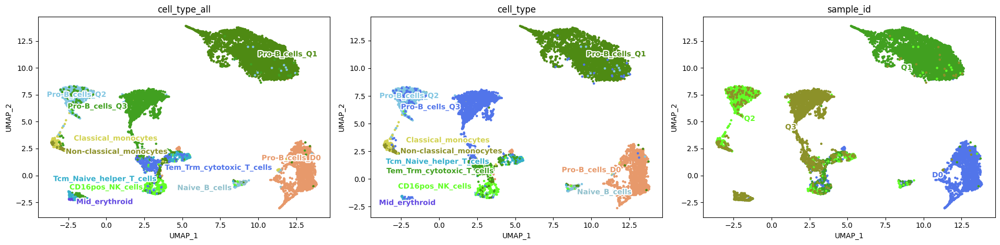

In [33]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type_all','cell_type', 'sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

In [34]:
cistopic_obj.cell_data.tss_enrichment.max()

51.88680752957533

In [35]:
cistopic_obj.cell_data.tss_enrichment.min()

10.0024834015134

In [36]:
cistopic_obj.cell_data.tss_enrichment.median()

15.723001165046076

In [37]:
cistopic_obj.cell_data.fraction_of_fragments_in_peaks.median()

0.6734407848633497

In [38]:
cistopic_obj.cell_data.log10_unique_fragments_count.median()

3.761852694466383

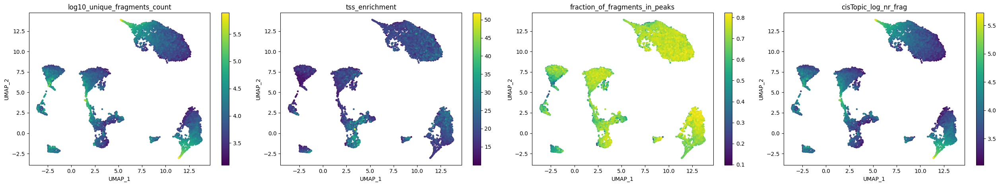

In [39]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'fraction_of_fragments_in_peaks', 'cisTopic_log_nr_frag'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

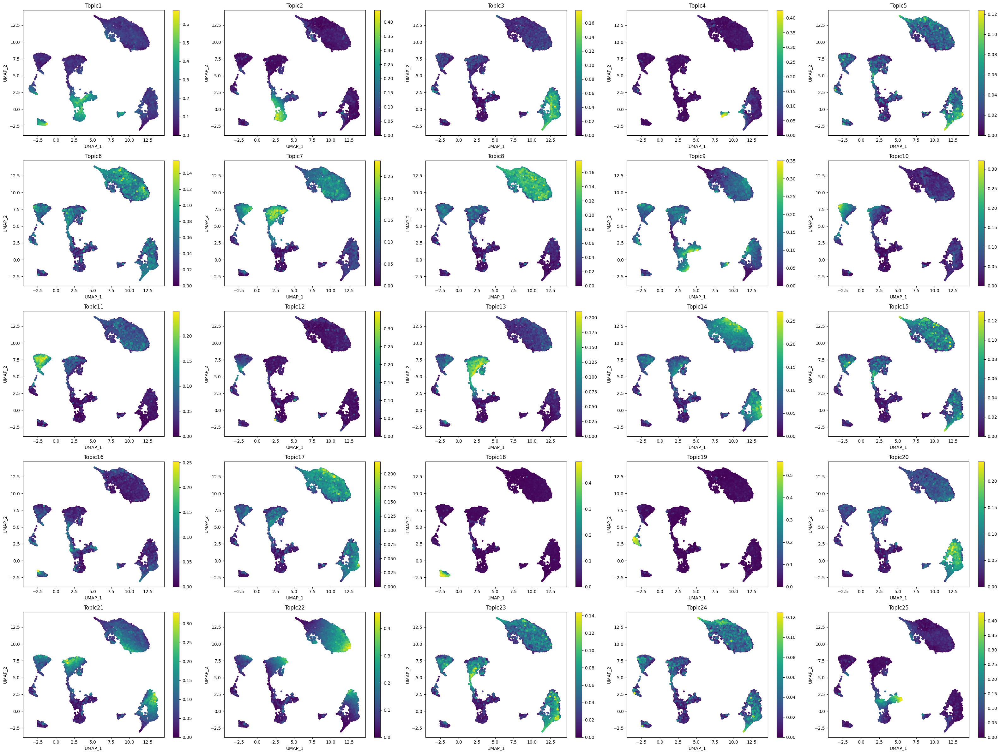

In [40]:
# cell topic contributions- 
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP',
    target = 'cell',
    num_columns=5
)

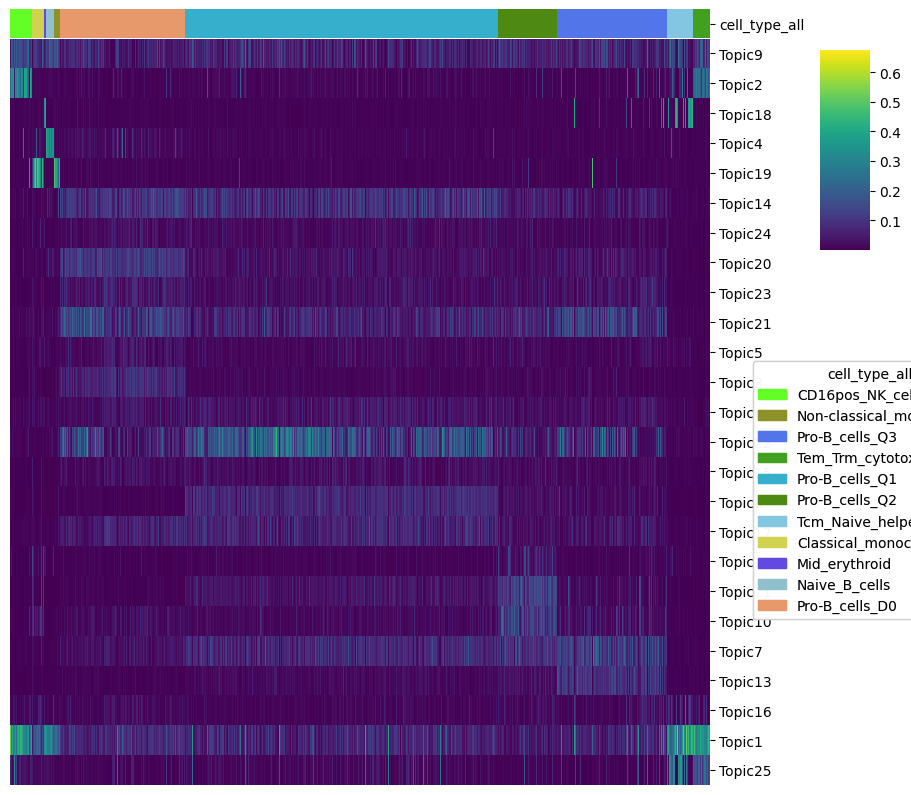

In [41]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['cell_type_all'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (10, 10)
)

# Topic binarization

In [44]:
from pycisTopic.topic_binarization import binarize_topics

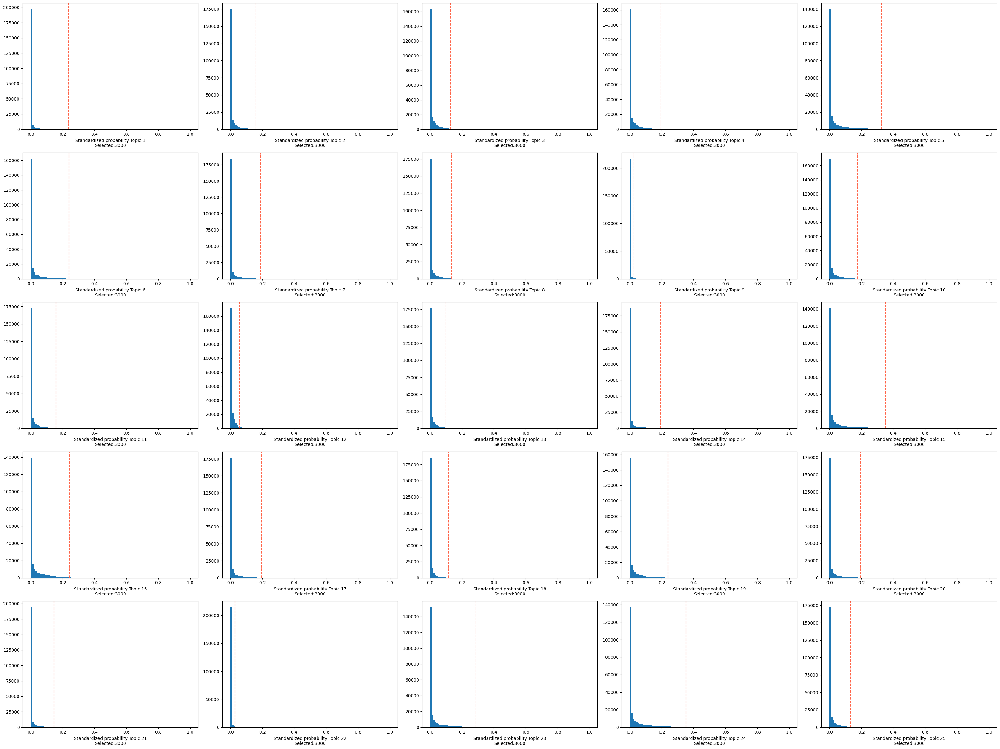

In [45]:
region_bin_topics_top_3k = binarize_topics(
    cistopic_obj, method='ntop', ntop = 3_000,
    plot=True, num_columns=5
)

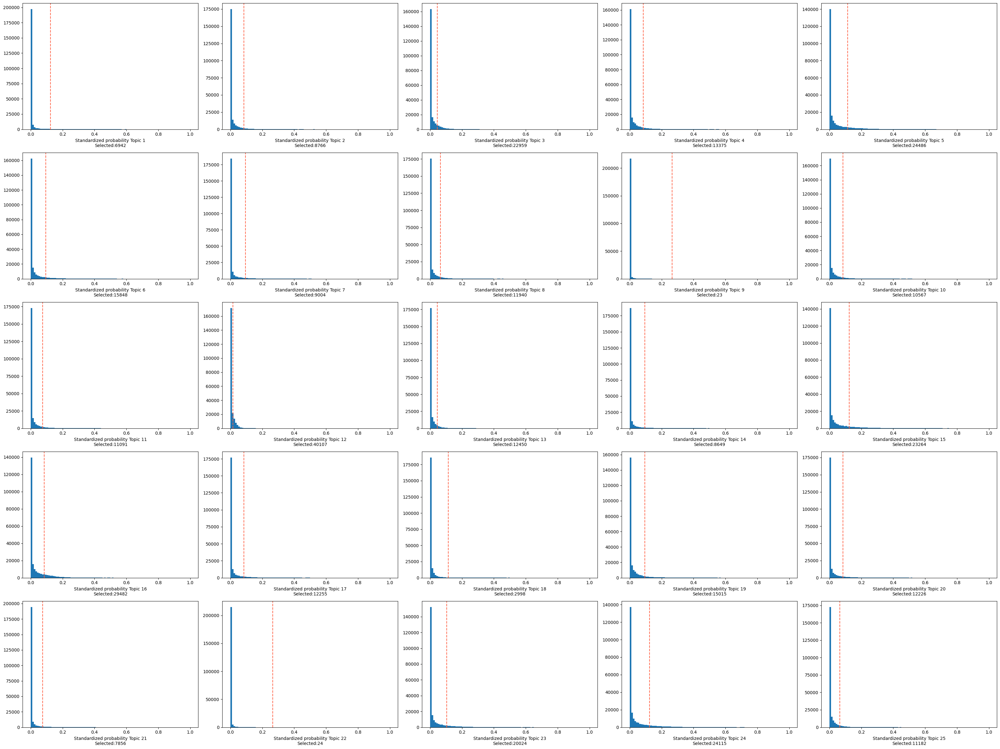

In [46]:
region_bin_topics_otsu = binarize_topics(
    cistopic_obj, method='otsu',
    plot=True, num_columns=5
)

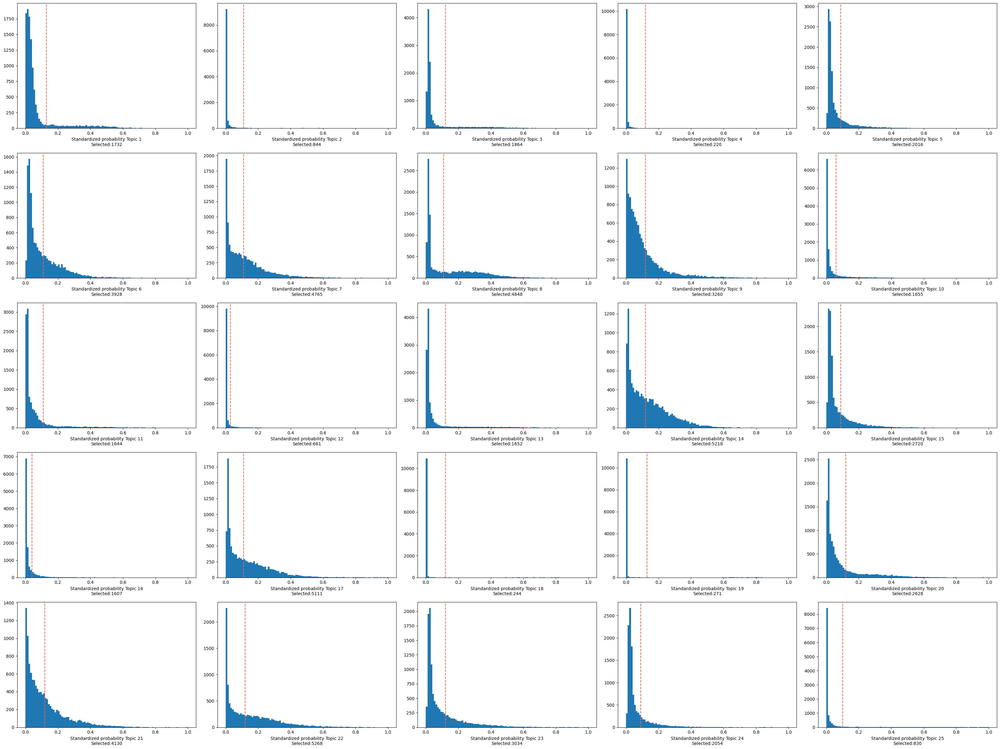

In [47]:
binarized_cell_topic = binarize_topics(
    cistopic_obj,
    target='cell',
    method='li',
    plot=True,
    num_columns=5, nbins=100)

In [48]:
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc, topic_annotation
import matplotlib.pyplot as plt
from pycisTopic.utils import fig2img

In [49]:
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

In [50]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

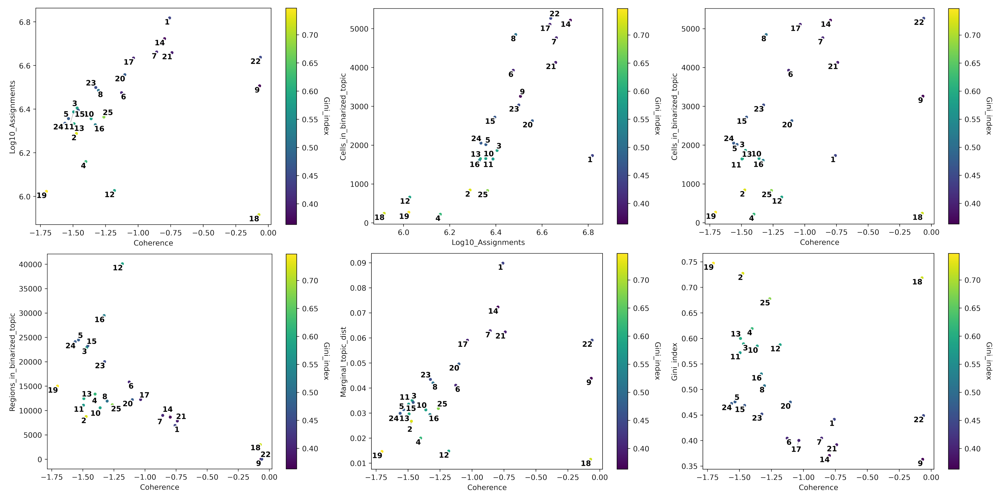

In [51]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
plt.show()

Number of assignments

Topic coherence (Mimno et al., 2011): Measures to which extent high scoring regions in the topic are actually co-accessible in the original data. If it is low it indicates that the topic is rather random. The higher, the better is a topic.

The marginal topic distribution: Indicates how much each topic contributes to the model. The higher, the better is a topic.

The gini index: Value between 0 and 1, that indicates the specificity of topics (0: General, 1:Specific)

If topics have been binarized, the number of regions/cells per topic will be added.

# Cell type - topic annotation

In [52]:
topic_annot = topic_annotation(
    cistopic_obj,
    annot_var='cell_type_all',
    binarized_cell_topic=binarized_cell_topic,
    general_topic_thr = 0.2
)

/opt/venv/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: divide by zero encountered in scalar divide
  zstat = value / std


In [53]:
topic_annot

,cell_type_all,Ratio_cells_in_topic,Ratio_group_in_population,is_general
Topic1,"CD16pos_NK_cells, Non-classical_monocytes, Tem...",0.152909,0.131809,False
Topic2,"CD16pos_NK_cells, Tem_Trm_cytotoxic_T_cells, T...",0.074512,0.092787,False
Topic3,Pro-B_cells_D0,0.164563,0.179218,False
Topic4,"Pro-B_cells_D0, Naive_B_cells",0.019423,0.191136,False
Topic5,"Tcm_Naive_helper_T_cells, Pro-B_cells_D0, Mid_...",0.177982,0.217975,False
Topic6,Pro-B_cells_Q1,0.346782,0.446897,False
Topic7,"Pro-B_cells_Q3, Pro-B_cells_Q1, Pro-B_cells_Q2",0.420676,0.688973,False
Topic8,Pro-B_cells_Q1,0.428004,0.446897,False
Topic9,"CD16pos_NK_cells, Non-classical_monocytes, Tem...",0.287808,0.129425,False
Topic10,"Pro-B_cells_Q3, Classical_monocytes, Pro-B_cel...",0.146111,0.259027,False


# DAR

In [54]:
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features
)
import numpy as np

In [55]:
imputed_acc_obj = impute_accessibility(
    cistopic_obj,
    selected_cells=None,
    selected_regions=None,
    scale_factor=10**6
)

2025-04-09 16:48:19,984 cisTopic     INFO     Imputing region accessibility
2025-04-09 16:48:19,985 cisTopic     INFO     Impute region accessibility for regions 0-20000
2025-04-09 16:48:21,370 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2025-04-09 16:48:22,720 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2025-04-09 16:48:24,061 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2025-04-09 16:48:25,472 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2025-04-09 16:48:26,844 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2025-04-09 16:48:28,172 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2025-04-09 16:48:29,561 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2025-04-09 16:48:30,960 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2025-04-09 16:48:32,390 cisTopic     

In [56]:
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)

2025-04-09 16:48:35,489 cisTopic     INFO     Normalizing imputed data
2025-04-09 16:48:50,083 cisTopic     INFO     Done!


2025-04-09 16:48:50,090 cisTopic     INFO     Calculating mean
2025-04-09 16:48:53,183 cisTopic     INFO     Calculating variance


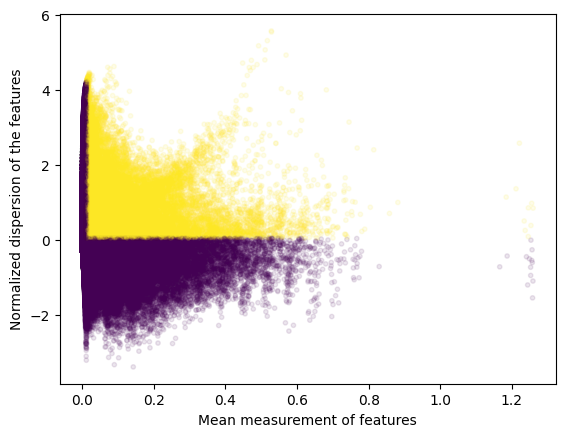

2025-04-09 16:49:16,738 cisTopic     INFO     Done!


In [57]:
variable_regions = find_highly_variable_features(
    normalized_imputed_acc_obj,
    min_disp = 0.05,
    min_mean = 0.0125,
    max_mean = 3,
    max_disp = np.inf,
    n_bins=20,
    n_top_features=None,
    plot=True
)

In [58]:
len(variable_regions)

37965

In [59]:
markers_dict= find_diff_features(
    cistopic_obj,
    imputed_acc_obj,
    variable='cell_type_all',
    var_features=variable_regions,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    _temp_dir='/scratch/leuven/338/vsc33857/ray_spill',
    split_pattern = '-'
)

2025-04-09 16:49:24,296	INFO worker.py:1724 -- Started a local Ray instance.


2025-04-09 16:49:25,555 cisTopic     INFO     Subsetting data for CD16pos_NK_cells (361 of 11327)
2025-04-09 16:49:29,920 cisTopic     INFO     Computing p-value for CD16pos_NK_cells
2025-04-09 16:49:37,197 cisTopic     INFO     Computing log2FC for CD16pos_NK_cells
2025-04-09 16:49:39,439 cisTopic     INFO     CD16pos_NK_cells done!
2025-04-09 16:49:39,448 cisTopic     INFO     Subsetting data for Classical_monocytes (192 of 11327)
2025-04-09 16:49:39,580 cisTopic     INFO     Computing p-value for Classical_monocytes
2025-04-09 16:49:45,614 cisTopic     INFO     Computing log2FC for Classical_monocytes
2025-04-09 16:49:45,660 cisTopic     INFO     Classical_monocytes done!
2025-04-09 16:49:45,667 cisTopic     INFO     Subsetting data for Mid_erythroid (27 of 11327)
2025-04-09 16:49:45,736 cisTopic     INFO     Computing p-value for Mid_erythroid
2025-04-09 16:49:51,983 cisTopic     INFO     Computing log2FC for Mid_erythroid
2025-04-09 16:49:52,068 cisTopic     INFO     Mid_erythroid

In [60]:
from pycisTopic.clust_vis import plot_imputed_features

In [61]:
cistopic_obj.cell_data.cell_type_all.value_counts()

Pro-B_cells_Q1               5062
Pro-B_cells_D0               2030
Pro-B_cells_Q3               1778
Pro-B_cells_Q2                964
Tcm_Naive_helper_T_cells      412
CD16pos_NK_cells              361
Tem_Trm_cytotoxic_T_cells     278
Classical_monocytes           192
Naive_B_cells                 135
Non-classical_monocytes        88
Mid_erythroid                  27
Name: cell_type_all, dtype: int64

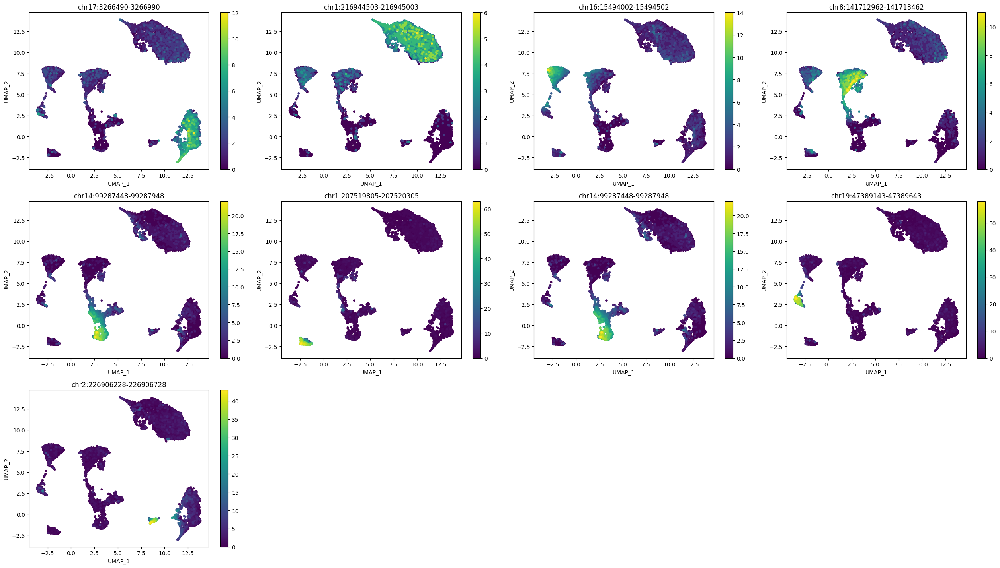

In [62]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=imputed_acc_obj,
    features=[markers_dict[x].index.tolist()[0] for x in ['Pro-B_cells_D0','Pro-B_cells_Q1','Pro-B_cells_Q2', 'Pro-B_cells_Q3', 'CD16pos_NK_cells', 'Tcm_Naive_helper_T_cells', 'Tem_Trm_cytotoxic_T_cells',
                                                         'Classical_monocytes','Naive_B_cells']],
    scale=False,
    num_columns=4
)

In [63]:
print("Number of DARs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(markers_dict[x])}")

Number of DARs found:
---------------------
  CD16pos_NK_cells: 10869
  Classical_monocytes: 9983
  Mid_erythroid: 6680
  Naive_B_cells: 8546
  Non-classical_monocytes: 9501
  Pro-B_cells_D0: 4724
  Pro-B_cells_Q1: 4526
  Pro-B_cells_Q2: 9660
  Pro-B_cells_Q3: 3450
  Tcm_Naive_helper_T_cells: 11043
  Tem_Trm_cytotoxic_T_cells: 12058


In [64]:
# save region sets
os.makedirs(os.path.join(out_dir, "region_sets"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_otsu"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_top_3k"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "DARs_cell_type"), exist_ok = True)

In [65]:
from pycisTopic.utils import region_names_to_coordinates

In [66]:
for topic in region_bin_topics_otsu:
    region_names_to_coordinates(
        region_bin_topics_otsu[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_otsu", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [67]:
for topic in region_bin_topics_top_3k:
    region_names_to_coordinates(
        region_bin_topics_top_3k[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_top_3k", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [68]:
for cell_type in markers_dict:
    region_names_to_coordinates(
        markers_dict[cell_type].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "DARs_cell_type", f"{cell_type}.bed"),
        sep = "\t",
        header = False, index = False
    )

# Gene activity

In [69]:
import pyranges as pr
from pycisTopic.gene_activity import get_gene_activity

In [70]:
chromsizes = pd.read_table(os.path.join(out_dir, "qc", "hg38.chrom_sizes_and_alias.tsv"))
chromsizes

,# ucsc,length,ensembl,refseq_id,genbank_id
0,chr1,248956422,1,NC_000001.11,CM000663.2
1,chr2,242193529,2,NC_000002.12,CM000664.2
2,chr3,198295559,3,NC_000003.12,CM000665.2
3,chr4,190214555,4,NC_000004.12,CM000666.2
4,chr5,181538259,5,NC_000005.10,CM000667.2
...,...,...,...,...,...
449,chrUn_KI270539v1,993,HSCHRUN_RANDOM_146,NT_187442.1,KI270539.1
450,chrUn_KI270385v1,990,HSCHRUN_RANDOM_195,NT_187487.1,KI270385.1
451,chrUn_KI270423v1,981,HSCHRUN_RANDOM_121,NT_187417.1,KI270423.1
452,chrUn_KI270392v1,971,HSCHRUN_RANDOM_193,NT_187485.1,KI270392.1


In [71]:
chromsizes.rename({"# ucsc": "Chromosome", "length": "End"}, axis = 1, inplace = True)
chromsizes["Start"] = 0
chromsizes = pr.PyRanges(chromsizes[["Chromosome", "Start", "End"]])

In [72]:
pr_annotation = pd.read_table(
        os.path.join(out_dir, "qc", "tss.bed")
    ).rename(
        {"Name": "Gene", "# Chromosome": "Chromosome"}, axis = 1)
pr_annotation["Transcription_Start_Site"] = pr_annotation["Start"]
pr_annotation = pr.PyRanges(pr_annotation)
pr_annotation

,Chromosome,Start,End,Gene,Score,Strand,Transcript_type,Transcription_Start_Site
0,GL000009.2,58375,58376,NaN,.,-,protein_coding,58375
1,GL000194.1,115017,115018,NaN,.,-,protein_coding,115017
2,GL000194.1,115054,115055,MAFIP,.,-,protein_coding,115054
3,GL000195.1,49163,49164,NaN,.,-,protein_coding,49163
4,GL000213.1,139654,139655,NaN,.,-,protein_coding,139654
...,...,...,...,...,...,...,...,...
87556,chrY,6911751,6911752,AMELY,.,-,protein_coding,6911751
87557,chrY,6872607,6872608,AMELY,.,-,protein_coding,6872607
87558,chrY,21918031,21918032,RBMY1E,.,-,protein_coding,21918031
87559,chrY,24047968,24047969,CDY1B,.,-,protein_coding,24047968


In [73]:
gene_act, weigths = get_gene_activity(
    imputed_acc_obj,
    pr_annotation,
    chromsizes,
    use_gene_boundaries=True, # Whether to use the whole search space or stop when encountering another gene
    upstream=[1000, 100000], # Search space upstream. The minimum means that even if there is a gene right next to it
                             # these bp will be taken (1kbp here)
    downstream=[1000,100000], # Search space downstream
    distance_weight=True, # Whether to add a distance weight (an exponential function, the weight will decrease with distance)
    decay_rate=1, # Exponent for the distance exponential funciton (the higher the faster will be the decrease)
    extend_gene_body_upstream=10000, # Number of bp upstream immune to the distance weight (their value will be maximum for
                          #this weight)
    extend_gene_body_downstream=500, # Number of bp downstream immune to the distance weight
    gene_size_weight=False, # Whether to add a weights based on the length of the gene
    gene_size_scale_factor='median', # Dividend to calculate the gene size weigth. Default is the median value of all genes
                          #in the genome
    remove_promoters=False, # Whether to remove promoters when computing gene activity scores
    average_scores=True, # Whether to divide by the total number of region assigned to a gene when calculating the gene
                          #activity score
    scale_factor=1, # Value to multiply for the final gene activity matrix
    extend_tss=[10,10], # Space to consider a promoter
    gini_weight = True, # Whether to add a gini index weigth. The more unique the region is, the higher this weight will be
    return_weights= True, # Whether to return the final weights
    project='Gene_activity') # Project name for the gene activity object

2025-04-09 16:53:23,352 cisTopic     INFO     Calculating gene boundaries
2025-04-09 16:53:38,582 cisTopic     INFO     Calculating distances


join: Strand data from other will be added as strand data to self.
If this is undesired use the flag apply_strand_suffix=False.
To turn off the warning set apply_strand_suffix to True or False.


2025-04-09 16:53:46,576 cisTopic     INFO     Calculating distance weigths
2025-04-09 16:53:47,067 cisTopic     INFO     Distance weights done
2025-04-09 16:53:47,067 cisTopic     INFO     Calculating gini weights
2025-04-09 16:54:07,592 cisTopic     INFO     Getting gene activity scores
2025-04-09 16:56:39,839 cisTopic     INFO     Creating imputed features object


In [ ]:
DAG_markers_dict= find_diff_features(
    cistopic_obj,
    gene_act,
    variable='cell_type_all',
    var_features=None,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    _temp_dir='/ray_spill',
    split_pattern = '-')

2025-04-09 16:56:44,964	INFO worker.py:1724 -- Started a local Ray instance.


2025-04-09 16:56:46,102 cisTopic     INFO     Subsetting data for CD16pos_NK_cells (361 of 11327)
2025-04-09 16:56:48,749 cisTopic     INFO     Computing p-value for CD16pos_NK_cells
2025-04-09 16:56:54,422 cisTopic     INFO     Computing log2FC for CD16pos_NK_cells
2025-04-09 16:56:56,663 cisTopic     INFO     CD16pos_NK_cells done!
2025-04-09 16:56:56,671 cisTopic     INFO     Subsetting data for Classical_monocytes (192 of 11327)
2025-04-09 16:56:56,761 cisTopic     INFO     Computing p-value for Classical_monocytes
2025-04-09 16:57:01,170 cisTopic     INFO     Computing log2FC for Classical_monocytes
2025-04-09 16:57:01,202 cisTopic     INFO     Classical_monocytes done!
2025-04-09 16:57:01,209 cisTopic     INFO     Subsetting data for Mid_erythroid (27 of 11327)
2025-04-09 16:57:01,313 cisTopic     INFO     Computing p-value for Mid_erythroid
2025-04-09 16:57:05,955 cisTopic     INFO     Computing log2FC for Mid_erythroid
2025-04-09 16:57:06,002 cisTopic     INFO     Mid_erythroid

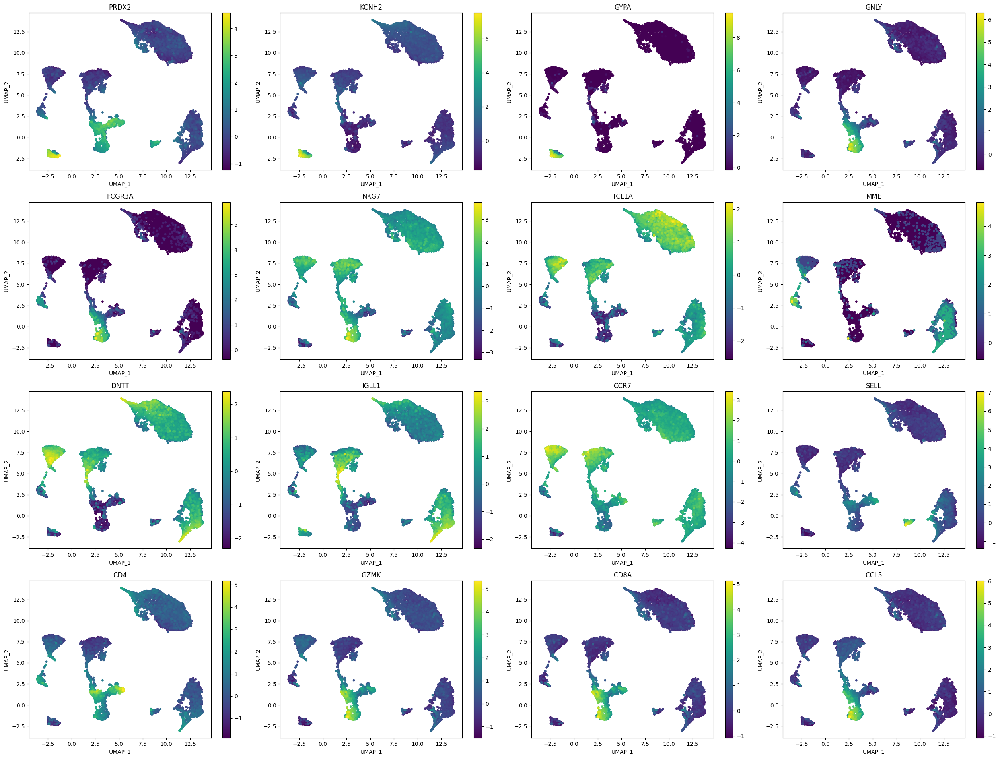

In [75]:
# cell typist
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=[
        'PRDX2','KCNH2','GYPA', # Mid erythroid
        'GNLY','FCGR3A','NKG7', # CD16+ NK cells
        'TCL1A', # naive B cells
        'MME','DNTT','IGLL1', # Pro-B cells
        'CCR7','SELL','CD4', # Tcm/Naive helper T cells
        'GZMK','CD8A','CCL5'], # Tem/Trm cytotoxic T cells
    scale=True,
    num_columns=4
)


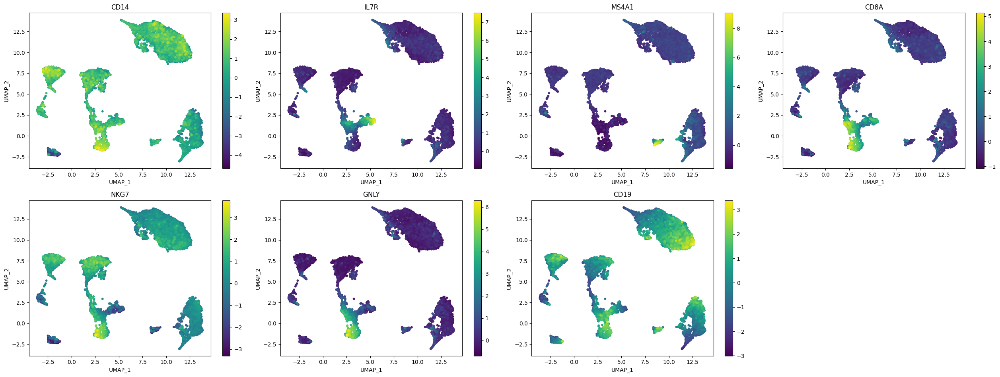

In [76]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CD14', # CD14 mono
              'IL7R', # CD4
              'MS4A1', # B
              'CD8A',  #CD8+T
              'NKG7','GNLY', #NK
              'CD19'], #CD19 B-all
    scale=True,
    num_columns=4
)

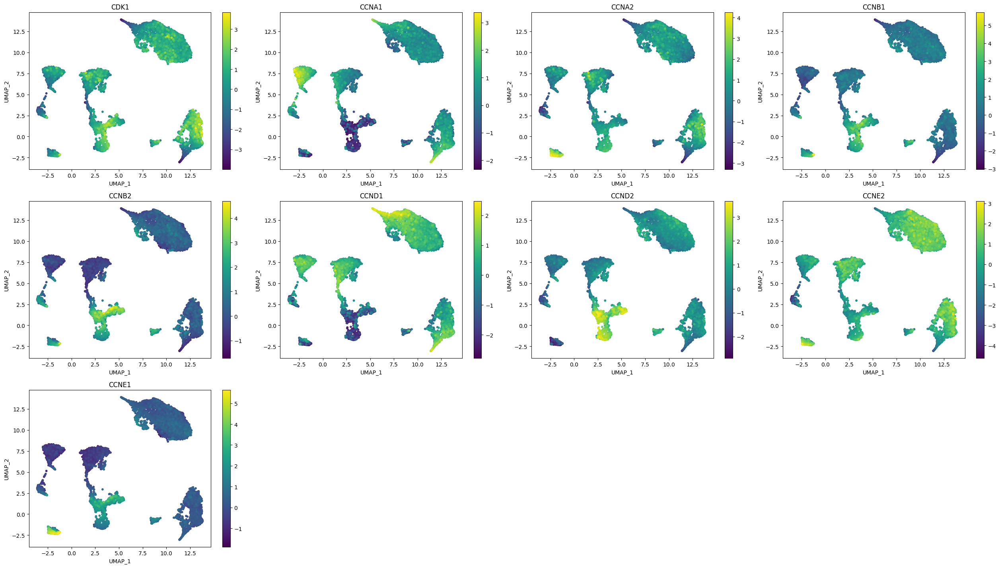

In [77]:
# cell cycle
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CDK1',
              'CCNA1','CCNA2',
              'CCNB1','CCNB2',
              'CCND1','CCND2',
              'CCNE2','CCNE1'],
    scale=True,
    num_columns=4
)

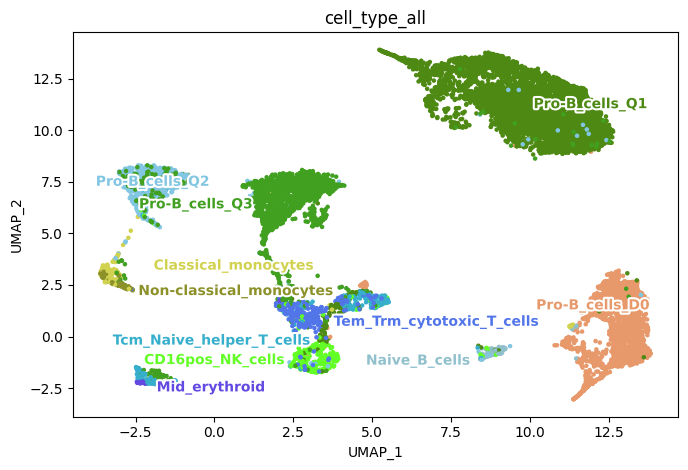

In [78]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type_all'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

In [79]:
print("Number of DAGs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(DAG_markers_dict[x])}")

Number of DAGs found:
---------------------
  CD16pos_NK_cells: 4148
  Classical_monocytes: 2220
  Mid_erythroid: 3448
  Naive_B_cells: 2940
  Non-classical_monocytes: 2487
  Pro-B_cells_D0: 771
  Pro-B_cells_Q1: 642
  Pro-B_cells_Q2: 923
  Pro-B_cells_Q3: 274
  Tcm_Naive_helper_T_cells: 4056
  Tem_Trm_cytotoxic_T_cells: 4808


In [80]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "cistopic_obj.pkl"), "wb")
)

## Save object to anndata 

In [ ]:
import scanpy as sc
ad = sc.AnnData(
    X = cistopic_obj.binary_matrix.T,
    obs = cistopic_obj.cell_data,
    var = cistopic_obj.region_data,
    obsm = {
	embedding: cistopic_obj.projections["cell"][embedding].values
        for embedding in cistopic_obj.projections["cell"].keys()}
)

In [82]:
ad

AnnData object with n_obs × n_vars = 11327 × 224360
    obs: 'log10_total_fragments_count', 'pdf_values_for_tss_enrichment', 'cisTopic_log_nr_acc', 'cisTopic_nr_acc', 'barcode_rank', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'cisTopic_nr_frag', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'total_fragments_count', 'duplication_ratio', 'tss_enrichment', 'cisTopic_log_nr_frag', 'pdf_values_for_duplication_ratio', 'log10_total_fragments_in_peaks_count', 'duplication_count', 'pdf_values_for_fraction_of_fragments_in_peaks', 'unique_fragments_count', 'fraction_of_fragments_in_peaks', 'barcode', 'cell_type', 'sample_id', 'pycisTopic_leiden_10_0.2', 'pycisTopic_leiden_10_0.3', 'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3', 'pycisTopic_leiden_10_6', 'is_nan', 'cell_type_all'
    var: 'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
 

In [83]:
ad.obsm = {key.lower(): value for key, value in ad.obsm.items()} # put obsm keys to lower to be functional in scanpy

In [84]:
ad

AnnData object with n_obs × n_vars = 11327 × 224360
    obs: 'log10_total_fragments_count', 'pdf_values_for_tss_enrichment', 'cisTopic_log_nr_acc', 'cisTopic_nr_acc', 'barcode_rank', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'cisTopic_nr_frag', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'total_fragments_count', 'duplication_ratio', 'tss_enrichment', 'cisTopic_log_nr_frag', 'pdf_values_for_duplication_ratio', 'log10_total_fragments_in_peaks_count', 'duplication_count', 'pdf_values_for_fraction_of_fragments_in_peaks', 'unique_fragments_count', 'fraction_of_fragments_in_peaks', 'barcode', 'cell_type', 'sample_id', 'pycisTopic_leiden_10_0.2', 'pycisTopic_leiden_10_0.3', 'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3', 'pycisTopic_leiden_10_6', 'is_nan', 'cell_type_all'
    var: 'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
 

... storing 'barcode' as categorical
... storing 'cell_type' as categorical
... storing 'sample_id' as categorical
... storing 'pycisTopic_leiden_10_0.2' as categorical
... storing 'pycisTopic_leiden_10_0.3' as categorical
... storing 'pycisTopic_leiden_10_0.6' as categorical
... storing 'pycisTopic_leiden_10_1.2' as categorical
... storing 'pycisTopic_leiden_10_3' as categorical
... storing 'pycisTopic_leiden_10_6' as categorical
... storing 'cell_type_all' as categorical
... storing 'Chromosome' as categorical
/opt/venv/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


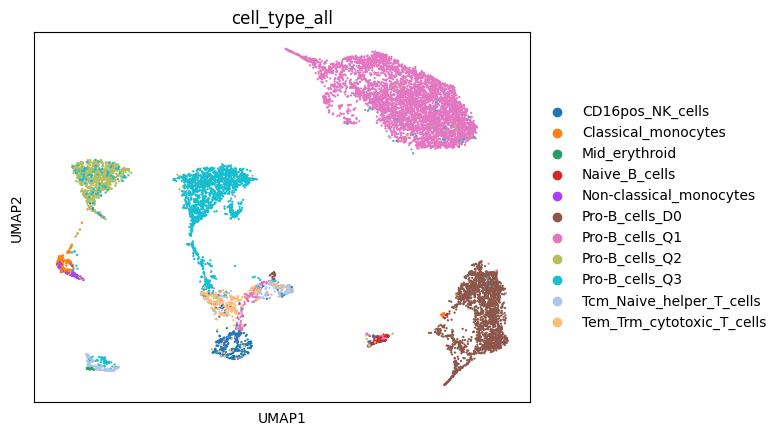

In [85]:
sc.pl.umap(ad, color ="cell_type_all")

In [86]:
ad.obs

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6,is_nan,cell_type_all
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243,48,5.238723,148120,122028,112191,5.049962,...,NaN,D0,1,1,7,15,32,49,True,Pro-B_cells_D0
GTCTAGCTCCAGGATG-D0___D0,3.878234,0.040761,3.598462,3967,1403,3.763877,5399,4431,4112,3.614159,...,Naive_B_cells,D0,7,8,11,18,27,26,False,Naive_B_cells
CTAATGTTCTTTGGGC-D0___D0,4.943682,0.007757,4.481973,30337,144,4.832649,55112,46460,42689,4.630326,...,Pro-B_cells_D0,D0,1,1,7,8,4,0,False,Pro-B_cells_D0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679,21,5.436795,215174,176098,161176,5.207303,...,NaN,D0,1,1,7,15,32,49,True,Pro-B_cells_D0
TCCTCAAAGGCCTAAG-D0___D0,5.161077,0.008855,4.642306,43884,88,5.046507,94715,78871,72652,4.861254,...,Pro-B_cells_D0,D0,1,1,7,15,32,49,False,Pro-B_cells_D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCAATTGTAGGTGAC-Q3___Q3,3.575419,0.050653,3.202488,1594,2244,3.405346,2457,1793,1634,3.213518,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,15,False,Pro-B_cells_Q3
GAGGGTGAGGTATGGT-Q3___Q3,3.422261,0.032544,3.083861,1213,2478,3.247237,1851,1324,1225,3.088490,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,51,False,Pro-B_cells_Q3
GCATTGTGTGGTGAAC-Q3___Q3,3.469380,0.034797,3.02735,1065,2419,3.306425,1654,1212,1116,3.048053,...,Pro-B_cells_Q3,Q3,1,1,2,1,18,9,False,Pro-B_cells_Q3
TGGACCAAGGTTGTAA-Q3___Q3,3.514415,0.033143,3.20871,1617,2350,3.346939,2421,1788,1641,3.215373,...,Pro-B_cells_Q3,Q3,2,2,1,4,10,19,False,Pro-B_cells_Q3


In [87]:
ad.obs.dtypes

log10_total_fragments_count                       float64
pdf_values_for_tss_enrichment                     float64
cisTopic_log_nr_acc                                object
cisTopic_nr_acc                                    object
barcode_rank                                       uint32
log10_unique_fragments_count                      float64
total_fragments_in_peaks_count                      int32
cisTopic_nr_frag                                   object
unique_fragments_in_peaks_count                    uint32
log10_unique_fragments_in_peaks_count             float64
total_fragments_count                               int32
duplication_ratio                                 float64
tss_enrichment                                    float64
cisTopic_log_nr_frag                               object
pdf_values_for_duplication_ratio                  float64
log10_total_fragments_in_peaks_count              float64
duplication_count                                   int64
pdf_values_for

In [88]:
ad.obs = ad.obs.apply(lambda col: col.astype(float) if col.dtype == 'object' else col)

In [89]:
ad.obs

,log10_total_fragments_count,pdf_values_for_tss_enrichment,cisTopic_log_nr_acc,cisTopic_nr_acc,barcode_rank,log10_unique_fragments_count,total_fragments_in_peaks_count,cisTopic_nr_frag,unique_fragments_in_peaks_count,log10_unique_fragments_in_peaks_count,...,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6,is_nan,cell_type_all
CTCACCACACTAATCC-D0___D0,5.359479,0.006128,4.779907,60243.0,48,5.238723,148120,122028.0,112191,5.049962,...,NaN,D0,1,1,7,15,32,49,True,Pro-B_cells_D0
GTCTAGCTCCAGGATG-D0___D0,3.878234,0.040761,3.598462,3967.0,1403,3.763877,5399,4431.0,4112,3.614159,...,Naive_B_cells,D0,7,8,11,18,27,26,False,Naive_B_cells
CTAATGTTCTTTGGGC-D0___D0,4.943682,0.007757,4.481973,30337.0,144,4.832649,55112,46460.0,42689,4.630326,...,Pro-B_cells_D0,D0,1,1,7,8,4,0,False,Pro-B_cells_D0
CTAGGATAGTGGCTTC-D0___D0,5.559921,0.001893,4.878975,75679.0,21,5.436795,215174,176098.0,161176,5.207303,...,NaN,D0,1,1,7,15,32,49,True,Pro-B_cells_D0
TCCTCAAAGGCCTAAG-D0___D0,5.161077,0.008855,4.642306,43884.0,88,5.046507,94715,78871.0,72652,4.861254,...,Pro-B_cells_D0,D0,1,1,7,15,32,49,False,Pro-B_cells_D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCAATTGTAGGTGAC-Q3___Q3,3.575419,0.050653,3.202488,1594.0,2244,3.405346,2457,1793.0,1634,3.213518,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,15,False,Pro-B_cells_Q3
GAGGGTGAGGTATGGT-Q3___Q3,3.422261,0.032544,3.083861,1213.0,2478,3.247237,1851,1324.0,1225,3.088490,...,Pro-B_cells_Q3,Q3,2,2,1,4,9,51,False,Pro-B_cells_Q3
GCATTGTGTGGTGAAC-Q3___Q3,3.469380,0.034797,3.027350,1065.0,2419,3.306425,1654,1212.0,1116,3.048053,...,Pro-B_cells_Q3,Q3,1,1,2,1,18,9,False,Pro-B_cells_Q3
TGGACCAAGGTTGTAA-Q3___Q3,3.514415,0.033143,3.208710,1617.0,2350,3.346939,2421,1788.0,1641,3.215373,...,Pro-B_cells_Q3,Q3,2,2,1,4,10,19,False,Pro-B_cells_Q3


In [90]:
import datetime
date = datetime.datetime.now().strftime('%Y%m%d')
ad.write(f'./outs/{date}_atac_ball_processed.h5ad')

In [91]:
pip list

Package                              Version
------------------------------------ -----------------
adjustText                           1.0.4
aiohttp                              3.9.3
aiosignal                            1.3.1
anndata                              0.10.5.post1
annoy                                1.17.3
appdirs                              1.4.4
arboreto                             0.1.6
argparse-dataclass                   2.0.0
array_api_compat                     1.5.1
asttokens                            2.4.1
attr                                 0.3.2
attrs                                23.2.0
bbknn                                1.6.0
beautifulsoup4                       4.12.3
bidict                               0.23.1
bioservices                          1.11.2
blosc2                               2.5.1
bokeh                                3.4.0
boltons                              23.1.1
bs4                                  0.0.2
cattrs                     